# TODO Needs Comments


In [1]:
import organoid_prediction_python as opp
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

home_directory = r"C:\Users\savill\OneDrive\Documents\PhD Jesse\Embryonic_organoid_prediction\Processing dataset for Paper\TLS_2D_morphostate_investigation/"
table_location = home_directory + "tabular_data"

translation_frame = pd.read_csv("translation_dataframe_timepoints.csv")
name_mapping = {key:new_key for key,new_key in zip(translation_frame["original_names"],translation_frame["plot_names"])}

data = pd.read_csv(f"{table_location}/All_Samples_Feature_Space_All_Features_48h,72h,96h_Normalised_per_Timepoint.csv")
data

,Run,Plate,ID,048h_raw_BF_AreaShape_area,048h_raw_BF_AreaShape_aspect_ratio,048h_raw_BF_AreaShape_axis_major_length,048h_raw_BF_AreaShape_axis_minor_length,048h_raw_BF_AreaShape_eccentricity,048h_raw_BF_AreaShape_feret_diameter_max,048h_raw_BF_AreaShape_perimeter,...,096h_str_BF_AreaShape_moments_hu_1,096h_str_BF_AreaShape_moments_hu_2,096h_str_BF_AreaShape_moments_hu_3,096h_str_BF_AreaShape_moments_hu_4,096h_str_BF_AreaShape_moments_hu_5,096h_str_BF_AreaShape_moments_hu_6,096h_str_BF_AreaShape_orientation,096h_str_BF_AreaShape_perimeter,096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation,096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation
0,RR,1,A1,0.754091,-0.889636,0.132588,1.204628,-1.000051,0.007074,0.615519,...,-0.769984,-0.768314,-0.188818,-0.081040,-0.108285,-0.018937,0.218694,0.485603,-0.237483,0.204173
1,RR,1,A2,-0.783470,-1.252670,-1.238409,0.003129,-1.752936,-1.131530,-0.724230,...,-0.587974,0.518118,-0.142104,-0.080919,-0.108023,0.017986,-1.310831,-0.276812,-0.930821,1.071650
2,RR,1,A3,1.636441,-0.184192,1.186196,1.565451,-0.008740,1.127225,1.795347,...,-0.724302,-0.679043,-0.186519,-0.081045,-0.108504,-0.019001,-0.638784,0.014028,0.406917,-0.068697
3,RR,1,A4,-0.525754,-0.513477,-0.672134,-0.202863,-0.422446,-0.849309,-0.402853,...,0.276192,-0.326314,0.038707,-0.073034,-0.013521,0.038021,0.362758,0.652506,0.992505,-0.551399
4,RR,1,A5,0.537872,-0.248943,0.294790,0.612413,-0.084969,0.059492,0.498737,...,0.544892,-0.696050,-0.161387,-0.081127,-0.113141,-0.013480,-0.324894,-1.090064,0.285818,-0.643907
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
762,TR,2,H8,-0.342295,-0.103644,-0.319022,-0.266071,0.083062,-0.511010,-0.233997,...,-0.240030,1.252083,-0.031233,-0.076766,-0.095753,0.232280,-0.531978,0.936472,-1.056426,0.770934
763,TR,2,H9,-0.925432,1.281638,-0.116354,-1.536867,1.304509,-0.330223,-1.009869,...,-0.010842,0.858318,-0.018204,-0.084586,-0.137911,0.247706,0.371618,1.965908,0.143556,0.712064
764,TR,2,H10,-1.873304,-1.279234,-2.131125,-1.049808,-1.821515,-2.016265,-1.929328,...,-0.454779,1.044578,-0.117763,-0.082320,-0.115499,0.052699,0.177291,1.923294,-1.128242,-0.816051
765,TR,2,H11,-2.408392,-0.915375,-2.411391,-1.803167,-1.045366,-2.414625,-2.306480,...,1.523053,0.369209,0.161155,-0.101456,-0.309307,0.338411,-0.341009,1.652660,-0.982778,1.840169


In [2]:
annotations = table_location + "/annotations_with_indices.csv"
annotation_df = pd.read_csv(annotations)
mapping = {"Real_Run":"RR", "Trial_Run":"TR"}
annotation_df["Run"] = [mapping[value] for value in annotation_df["Run"].to_numpy()]
no_na_annot = annotation_df[annotation_df["Morph_Class"]!="NA_NA"]

data_annotated = data.set_index(["Run","Plate","ID"]).merge(no_na_annot,on=["Run","Plate","ID"])
data_annotated

,Run,Plate,ID,048h_raw_BF_AreaShape_area,048h_raw_BF_AreaShape_aspect_ratio,048h_raw_BF_AreaShape_axis_major_length,048h_raw_BF_AreaShape_axis_minor_length,048h_raw_BF_AreaShape_eccentricity,048h_raw_BF_AreaShape_feret_diameter_max,048h_raw_BF_AreaShape_perimeter,...,096h_str_BF_AreaShape_moments_hu_4,096h_str_BF_AreaShape_moments_hu_5,096h_str_BF_AreaShape_moments_hu_6,096h_str_BF_AreaShape_orientation,096h_str_BF_AreaShape_perimeter,096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation,096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation,Axes,Morph,Morph_Class
0,RR,1,A1,0.754091,-0.889636,0.132588,1.204628,-1.000051,0.007074,0.615519,...,-0.081040,-0.108285,-0.018937,0.218694,0.485603,-0.237483,0.204173,single,good,single_good
1,RR,1,A2,-0.783470,-1.252670,-1.238409,0.003129,-1.752936,-1.131530,-0.724230,...,-0.080919,-0.108023,0.017986,-1.310831,-0.276812,-0.930821,1.071650,single,bad,single_bad
2,RR,1,A3,1.636441,-0.184192,1.186196,1.565451,-0.008740,1.127225,1.795347,...,-0.081045,-0.108504,-0.019001,-0.638784,0.014028,0.406917,-0.068697,single,bad,single_bad
3,RR,1,A4,-0.525754,-0.513477,-0.672134,-0.202863,-0.422446,-0.849309,-0.402853,...,-0.073034,-0.013521,0.038021,0.362758,0.652506,0.992505,-0.551399,single,good,single_good
4,RR,1,A5,0.537872,-0.248943,0.294790,0.612413,-0.084969,0.059492,0.498737,...,-0.081127,-0.113141,-0.013480,-0.324894,-1.090064,0.285818,-0.643907,single,bad,single_bad
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
433,TR,2,H8,-0.342295,-0.103644,-0.319022,-0.266071,0.083062,-0.511010,-0.233997,...,-0.076766,-0.095753,0.232280,-0.531978,0.936472,-1.056426,0.770934,unclassified,unclassified,unclassified_unclassified
434,TR,2,H9,-0.925432,1.281638,-0.116354,-1.536867,1.304509,-0.330223,-1.009869,...,-0.084586,-0.137911,0.247706,0.371618,1.965908,0.143556,0.712064,single,good,single_good
435,TR,2,H10,-1.873304,-1.279234,-2.131125,-1.049808,-1.821515,-2.016265,-1.929328,...,-0.082320,-0.115499,0.052699,0.177291,1.923294,-1.128242,-0.816051,double,unclassified,double_unclassified
436,TR,2,H11,-2.408392,-0.915375,-2.411391,-1.803167,-1.045366,-2.414625,-2.306480,...,-0.101456,-0.309307,0.338411,-0.341009,1.652660,-0.982778,1.840169,single,good,single_good


In [3]:
#data_annotated.keys().to_numpy()

In [4]:
dat_morph = data_annotated[data_annotated["Morph"] != "unclassified"]
dat_morph = dat_morph[dat_morph['048h_raw_BF_AreaShape_area'].notna()].dropna(axis=1).dropna()
dat_morph = dat_morph.drop([key for key in dat_morph.keys() if any([term in key for term in ["Location","orientation","_X","_Y","UMAP","PC"]])],axis=1) #,
counts = dat_morph.groupby("Morph")["Run"].count()
print(counts)


dat_morph

Morph
bad     183
good    128
Name: Run, dtype: int64


,Run,Plate,ID,048h_raw_BF_AreaShape_area,048h_raw_BF_AreaShape_aspect_ratio,048h_raw_BF_AreaShape_axis_major_length,048h_raw_BF_AreaShape_axis_minor_length,048h_raw_BF_AreaShape_eccentricity,048h_raw_BF_AreaShape_feret_diameter_max,048h_raw_BF_AreaShape_perimeter,...,096h_str_BF_AreaShape_moments_hu_3,096h_str_BF_AreaShape_moments_hu_4,096h_str_BF_AreaShape_moments_hu_5,096h_str_BF_AreaShape_moments_hu_6,096h_str_BF_AreaShape_perimeter,096h_str_CH_AreaShape_Bra_MajorAxis_Polarisation,096h_str_CH_AreaShape_Bra_MinorAxis_Polarisation,Axes,Morph,Morph_Class
0,RR,1,A1,0.754091,-0.889636,0.132588,1.204628,-1.000051,0.007074,0.615519,...,-0.188818,-0.081040,-0.108285,-0.018937,0.485603,-0.237483,0.204173,single,good,single_good
1,RR,1,A2,-0.783470,-1.252670,-1.238409,0.003129,-1.752936,-1.131530,-0.724230,...,-0.142104,-0.080919,-0.108023,0.017986,-0.276812,-0.930821,1.071650,single,bad,single_bad
2,RR,1,A3,1.636441,-0.184192,1.186196,1.565451,-0.008740,1.127225,1.795347,...,-0.186519,-0.081045,-0.108504,-0.019001,0.014028,0.406917,-0.068697,single,bad,single_bad
3,RR,1,A4,-0.525754,-0.513477,-0.672134,-0.202863,-0.422446,-0.849309,-0.402853,...,0.038707,-0.073034,-0.013521,0.038021,0.652506,0.992505,-0.551399,single,good,single_good
4,RR,1,A5,0.537872,-0.248943,0.294790,0.612413,-0.084969,0.059492,0.498737,...,-0.161387,-0.081127,-0.113141,-0.013480,-1.090064,0.285818,-0.643907,single,bad,single_bad
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
429,TR,2,H4,-1.801231,0.189615,-1.378837,-1.801012,0.392510,-1.263560,-1.668959,...,-0.167413,-0.081086,-0.109219,-0.024483,1.594305,-0.631962,0.292950,single,good,single_good
430,TR,2,H5,-1.805599,0.135760,-1.400417,-1.768377,0.338334,-1.393948,-2.002972,...,0.473177,-0.022139,0.267669,0.200866,2.173369,1.316448,-0.919674,single,bad,single_bad
434,TR,2,H9,-0.925432,1.281638,-0.116354,-1.536867,1.304509,-0.330223,-1.009869,...,-0.018204,-0.084586,-0.137911,0.247706,1.965908,0.143556,0.712064,single,good,single_good
436,TR,2,H11,-2.408392,-0.915375,-2.411391,-1.803167,-1.045366,-2.414625,-2.306480,...,0.161155,-0.101456,-0.309307,0.338411,1.652660,-0.982778,1.840169,single,good,single_good


In [5]:
gt_keys = ["Run","Plate","ID","Axes","Morph","Morph_Class"]
X = dat_morph.drop(gt_keys,axis=1).rename(columns = name_mapping)
Y = pd.get_dummies(dat_morph["Morph"])["good"]
Y

0       True
1      False
2      False
3       True
4      False
       ...  
429     True
430    False
434     True
436     True
437     True
Name: good, Length: 311, dtype: bool

In [6]:
# import PLSRegression from scikitlearn
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import StandardScaler
# fit the pls regression
my_plsr = PLSRegression(n_components=2, scale=False)
my_plsr.fit(StandardScaler().fit_transform(X), Y)

PLSRegression(scale=False)

In [7]:
# extract scores (one score per individual per component)
scores_df = pd.DataFrame(my_plsr.x_scores_)

# standardize scores between -1 and 1 so they fit on the plot
std_scores_dim1 = 2 * ( (scores_df[0] - min(scores_df[0])) / (max(scores_df[0]) - min(scores_df[0])) ) -1
std_scores_dim2 = 2 * ( (scores_df[1] - min(scores_df[1])) / (max(scores_df[1]) - min(scores_df[1])) ) -1



meta NOT subset; don't know how to subset; dropped


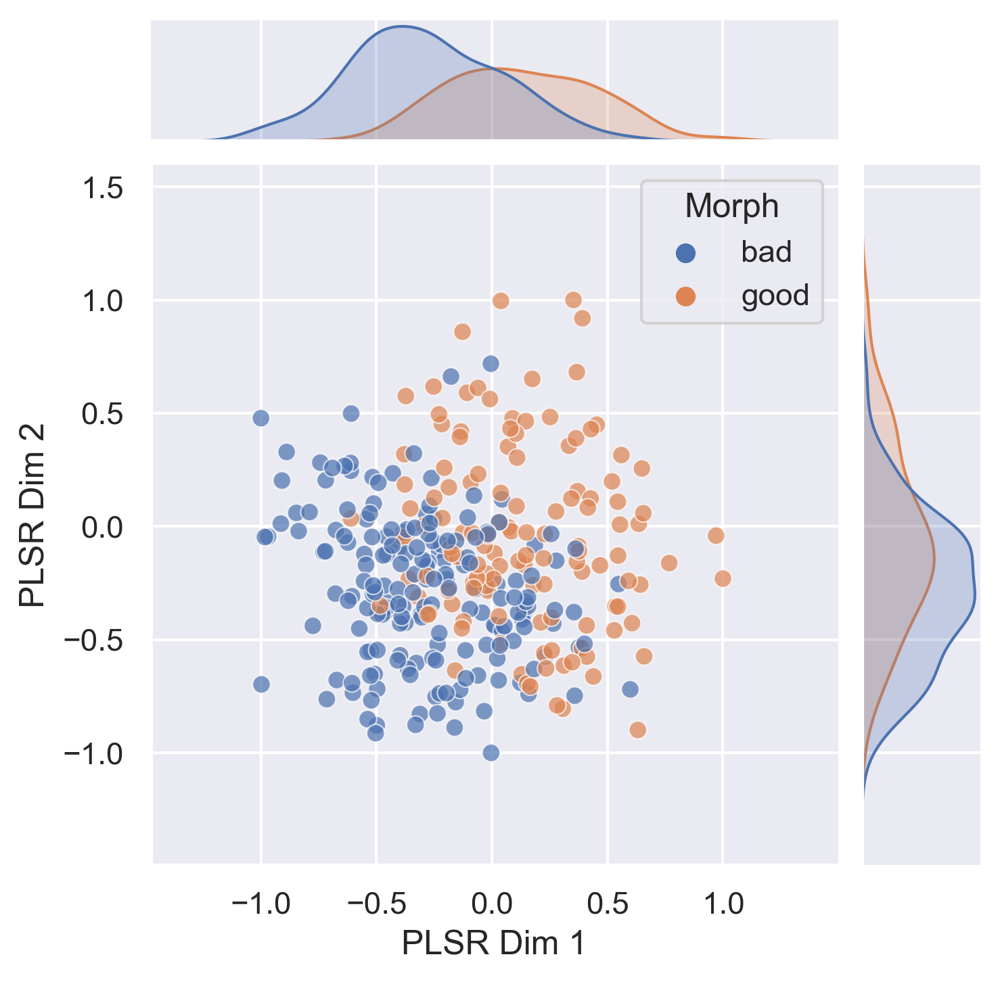

In [8]:
# create the biplot by plotting each data point individualle (one by one)
import matplotlib as mpl
import seaborn as sns

out_fig_2 = home_directory + "/" + r"Plots\Fig 2"

sns.set()

df_components = pd.DataFrame(
    {
        "Morph":dat_morph["Morph"].to_numpy(),
        "good":Y.to_numpy().astype(bool),
        "PLSR Dim 1":std_scores_dim1,
        "PLSR Dim 2":std_scores_dim2,
    }
)

sns.jointplot(df_components,x="PLSR Dim 1",y="PLSR Dim 2",hue="Morph", **{"alpha":0.7,"s":40},height=5,hue_order=["bad","good"])
plt.savefig(f"{out_fig_2}/PLSR Morph components.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [9]:
sequenced_dataframe = pd.read_csv(f"{table_location}/Morphodata_All_Features_Sequenced_096h.csv")
sequenced_ids = sequenced_dataframe[["Plate","Sample"]].rename(columns={"Sample":"ID"})
sequenced_ids["Run"] = ["RR" for i in range(len(sequenced_ids))]
sequenced_w_features = data.merge(sequenced_ids,on=["Run","Plate","ID"])
X_seq = sequenced_w_features.drop(["Run","Plate","ID"],axis=1)
X_seq = X_seq.rename(columns = name_mapping)[X.columns].dropna()
X_seq

,048h-[Area]-BF,048h-[Aspect Ratio]-BF,048h-[Axis Major Length]-BF,048h-[Axis Minor Length]-BF,048h-[Eccentricity]-BF,048h-[Feret Diameter Max]-BF,048h-[Perimeter]-BF,048h-[Solidity]-BF,048h-[str Area]-BF,048h-[str Aspect Ratio]-BF,...,096h-[str Moments Hu 0]-BF,096h-[str Moments Hu 1]-BF,096h-[str Moments Hu 2]-BF,096h-[str Moments Hu 3]-BF,096h-[str Moments Hu 4]-BF,096h-[str Moments Hu 5]-BF,096h-[str Moments Hu 6]-BF,096h-[str Perimeter]-BF,096h-[str Major Axis Polarisation]-TmCH,096h-[str Minor Axis Polarisation]-TmCH
0,1.343781,-1.084053,0.473754,1.861678,-1.368380,0.340415,1.209900,0.045843,1.368686,-0.946063,...,-0.850729,-0.750871,-0.416198,-0.185718,-0.081053,-0.108452,-0.018979,-0.057015,-0.714090,0.560549
1,0.780299,-0.728520,0.224086,1.112453,-0.735236,-0.053653,0.906392,0.187637,0.756963,-0.764181,...,0.645626,0.795630,-0.795341,-0.159206,-0.080922,-0.097875,-0.021843,0.400874,1.333237,-0.974813
2,1.311020,-0.692040,0.672477,1.597554,-0.679235,0.873954,1.188331,0.099474,1.414079,-0.942466,...,0.569692,0.645824,-0.593281,-0.101873,-0.079644,-0.066206,-0.022051,0.053382,1.488942,-0.834810
3,-0.019058,0.463679,0.220871,-0.292457,0.652306,-0.132148,0.017438,-0.244992,0.238187,0.702744,...,1.082586,1.156631,-0.240315,0.156456,-0.064577,0.087304,-0.059926,0.312033,1.231474,-0.612474
4,1.376541,0.481242,1.312973,0.912816,0.668123,0.970236,1.320366,-0.356413,1.379494,0.357776,...,1.214700,1.298699,-0.410682,0.025243,-0.075355,-0.021428,0.100229,0.967809,0.961865,-0.501210
5,0.976863,0.332189,0.944384,0.671604,0.530817,1.153840,0.958466,-0.286285,0.957989,0.468867,...,-0.770297,-0.653413,-0.432491,-0.178506,-0.080998,-0.107369,-0.017106,-0.604949,0.725118,-0.612652
6,1.935654,1.088473,2.049544,1.027973,1.164278,1.493811,1.773777,0.873029,2.466762,1.721196,...,0.077625,-0.563467,2.948413,-0.185819,-0.081071,-0.108858,-0.018391,0.467805,1.460339,-0.580439
7,-0.383792,-1.330647,-0.959900,0.437953,-1.962592,-0.882101,-0.445993,-0.301542,-0.325982,-1.261276,...,1.359903,1.545949,-0.799768,-0.152596,-0.080844,-0.085961,-0.019959,-0.167412,1.508292,-0.626827
8,1.223659,0.664424,1.283888,0.668633,0.827739,1.106133,1.209900,0.267198,1.068229,0.470019,...,-0.926338,-0.749436,-0.764690,-0.188676,-0.081040,-0.108285,-0.018932,-0.945921,-0.048169,-0.166264
9,1.348149,-0.001250,1.041189,1.176035,0.195287,0.845889,1.261974,0.328053,1.377333,0.169717,...,-0.895614,-0.731857,-0.616296,-0.186667,-0.081039,-0.108248,-0.018758,-2.250102,-0.328878,0.333339


In [10]:
sequenced_PLSR_vals = my_plsr.transform(X_seq)
sequenced_scaled_vals = np.array([2 * ( (sequenced_PLSR_vals[:,i] - min(scores_df[i])) / (max(scores_df[i]) - min(scores_df[i])) ) -1 for i in range(2)])
sequenced_scaled_vals

array([[ 0.35244194,  0.01512416, -0.06810865, -0.02938669, -0.16279546,
         0.00327792, -0.65042231, -0.47053804,  0.16226793, -0.27679787,
         0.12162875,  0.18703226, -0.43945941, -0.28981368, -0.00185104,
        -0.44716707,  0.59943881, -0.20010305, -0.00753548, -0.03518649,
        -0.16687549,  0.35071268,  0.39684908,  1.02245343],
       [-0.76270594, -0.27198203, -0.69830302, -0.39120972, -0.52540152,
        -0.21943407, -0.3161503 ,  0.07340269, -0.80853566, -0.7791035 ,
        -0.51620175, -0.7821821 , -0.11766796, -0.47738181, -0.23994834,
        -0.36142898, -0.7520257 , -0.45607335, -0.5984462 , -0.49864491,
        -0.74780611, -0.58376487, -0.71371878, -0.57364994]])

meta NOT subset; don't know how to subset; dropped


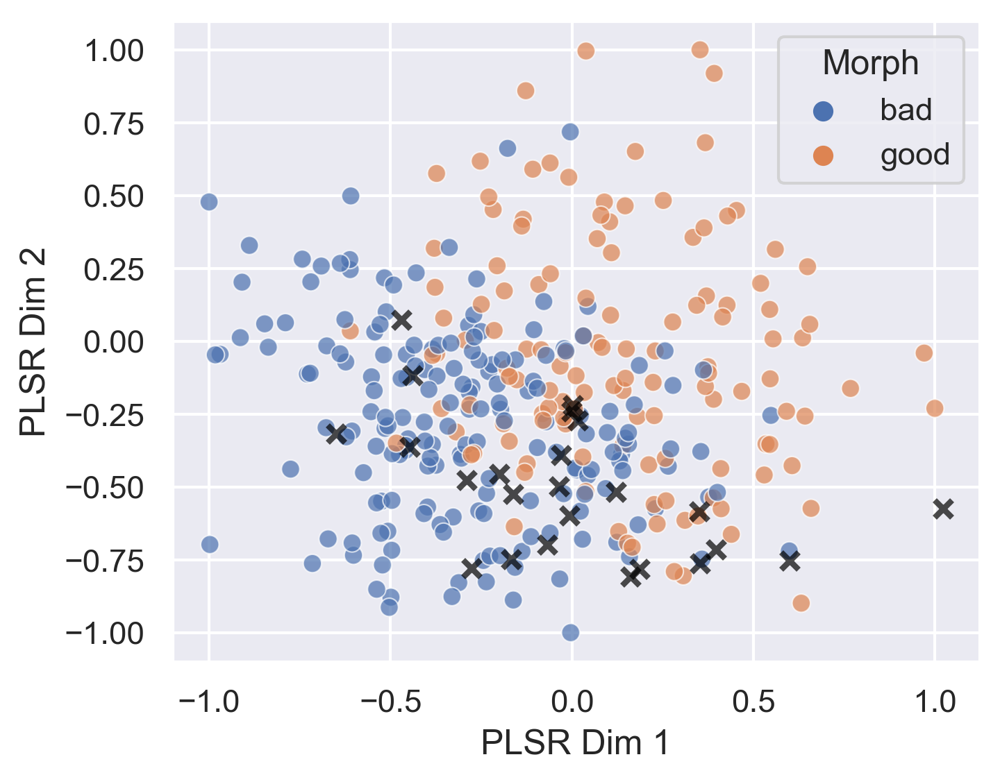

In [11]:
fig,ax = plt.subplots(figsize=(5,4))
sns.scatterplot(df_components,x="PLSR Dim 1",y="PLSR Dim 2",hue="Morph",hue_order=["bad","good"], **{"alpha":0.7,"s":40},ax=ax)
ax.scatter(sequenced_scaled_vals[0],sequenced_scaled_vals[1],c="black",marker = "x",edgecolor = "black",linewidths=2,alpha = 0.7)

out_PLSR = f"{home_directory}/Plots/PLSR Feature Plots/"
plt.savefig(f"{out_PLSR}/PLSR Morph w 96h sequenced samples.pdf", format="pdf", bbox_inches="tight")

In [12]:
#extract loadings (one loading per variable per component)
loadings_df = pd.DataFrame(my_plsr.x_loadings_,index=X.columns,columns=["PLSR Dim 1","PLSR Dim 2"])
print(np.min(loadings_df),np.max(loadings_df))

loadings_df.to_csv("PLSR Morph Loadings.csv")

-0.1796175910409279 0.13651959363300314


# Main Contributors (0.05 and 0.95 percentile)

meta NOT subset; don't know how to subset; dropped


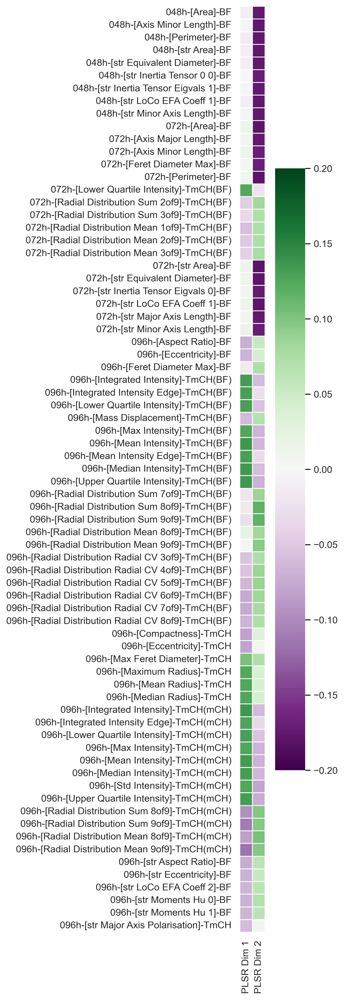

In [13]:
quantiles_upper = np.quantile(loadings_df,0.95,axis=0)
quantiles_lower = np.quantile(loadings_df,0.05,axis=0)
main_contributers = [
    key for key in loadings_df.index if (
        loadings_df.loc[key][0]>=quantiles_upper[0] or 
        loadings_df.loc[key][1]>=quantiles_upper[1] or 
        loadings_df.loc[key][0]<=quantiles_lower[0] or 
        loadings_df.loc[key][1]<=quantiles_lower[1]
    )
]

fig,ax = plt.subplots(1,1,figsize = (5,16))

sns.heatmap(loadings_df.loc[main_contributers], cmap = "PRGn",vmin=-0.2, vmax=0.2, xticklabels='auto', yticklabels='auto', ax=ax,linewidths=0.5,square=True)
ax.set_facecolor('white')

plt.tight_layout()
plt.savefig(f"{out_fig_2}/PLSR Morph loadings 0.05 quantile.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [14]:
loadings_df.loc[main_contributers].to_csv(f"{out_PLSR}/PLSR Morph loadings 0.05 quantile only axes.csv")
main_contributers

['048h-[Area]-BF',
 '048h-[Axis Minor Length]-BF',
 '048h-[Perimeter]-BF',
 '048h-[str Area]-BF',
 '048h-[str Equivalent Diameter]-BF',
 '048h-[str Inertia Tensor 0 0]-BF',
 '048h-[str Inertia Tensor Eigvals 1]-BF',
 '048h-[str LoCo EFA Coeff 1]-BF',
 '048h-[str Minor Axis Length]-BF',
 '072h-[Area]-BF',
 '072h-[Axis Major Length]-BF',
 '072h-[Axis Minor Length]-BF',
 '072h-[Feret Diameter Max]-BF',
 '072h-[Perimeter]-BF',
 '072h-[Lower Quartile Intensity]-TmCH(BF)',
 '072h-[Radial Distribution Sum 2of9]-TmCH(BF)',
 '072h-[Radial Distribution Sum 3of9]-TmCH(BF)',
 '072h-[Radial Distribution Mean 1of9]-TmCH(BF)',
 '072h-[Radial Distribution Mean 2of9]-TmCH(BF)',
 '072h-[Radial Distribution Mean 3of9]-TmCH(BF)',
 '072h-[str Area]-BF',
 '072h-[str Equivalent Diameter]-BF',
 '072h-[str Inertia Tensor Eigvals 0]-BF',
 '072h-[str LoCo EFA Coeff 1]-BF',
 '072h-[str Major Axis Length]-BF',
 '072h-[str Minor Axis Length]-BF',
 '096h-[Aspect Ratio]-BF',
 '096h-[Eccentricity]-BF',
 '096h-[Feret D

In [15]:
main_contributers_axes_and_morph = ['048h-[Area]-BF',
 '048h-[Axis Minor Length]-BF',
 '048h-[Perimeter]-BF',
 '048h-[str Area]-BF',
 '048h-[str Equivalent Diameter]-BF',
 '048h-[str Inertia Tensor 0 0]-BF',
 '048h-[str Inertia Tensor Eigvals 1]-BF',
 '048h-[str LoCo EFA Coeff 1]-BF',
 '048h-[str Minor Axis Length]-BF',
 '072h-[Area]-BF',
 '072h-[Axis Major Length]-BF',
 '072h-[Axis Minor Length]-BF',
 '072h-[Feret Diameter Max]-BF',
 '072h-[Integrated Intensity Edge]-TmCH(BF)',
 '072h-[Integrated Intensity]-TmCH(BF)',
 '072h-[Lower Quartile Intensity]-TmCH(BF)',
 '072h-[M AD Intensity]-TmCH(BF)',
 '072h-[Mean Intensity Edge]-TmCH(BF)',
 '072h-[Mean Intensity]-TmCH(BF)',
 '072h-[Median Intensity]-TmCH(BF)',
 '072h-[Perimeter]-BF',
 '072h-[Radial Distribution Mean 1of9]-TmCH(BF)',
 '072h-[Radial Distribution Mean 2of9]-TmCH(BF)',
 '072h-[Radial Distribution Mean 3of9]-TmCH(BF)',
 '072h-[Radial Distribution Mean 9of9]-TmCH(BF)',
 '072h-[Radial Distribution Sum 2of9]-TmCH(BF)',
 '072h-[Radial Distribution Sum 3of9]-TmCH(BF)',
 '072h-[Radial Distribution Sum 9of9]-TmCH(BF)',
 '072h-[Std Intensity]-TmCH(BF)',
 '072h-[Upper Quartile Intensity]-TmCH(BF)',
 '072h-[str Area]-BF',
 '072h-[str Aspect Ratio]-BF',
 '072h-[str Equivalent Diameter]-BF',
 '072h-[str Inertia Tensor Eigvals 0]-BF',
 '072h-[str LoCo EFA Coeff 1]-BF',
 '072h-[str Major Axis Length]-BF',
 '072h-[str Minor Axis Length]-BF',
 '096h-[Area Fraction]-TmCH',
 '096h-[Area]-TmCH',
 '096h-[Aspect Ratio]-BF',
 '096h-[Axis Minor Length]-BF',
 '096h-[Compactness]-TmCH',
 '096h-[Convex Area]-TmCH',
 '096h-[Eccentricity]-BF',
 '096h-[Eccentricity]-TmCH',
 '096h-[Equivalent Diameter]-TmCH',
 '096h-[Feret Diameter Max]-BF',
 '096h-[Integrated Intensity Edge]-TmCH(BF)',
 '096h-[Integrated Intensity Edge]-TmCH(mCH)',
 '096h-[Integrated Intensity]-TmCH(BF)',
 '096h-[Integrated Intensity]-TmCH(mCH)',
 '096h-[Lower Quartile Intensity]-TmCH(BF)',
 '096h-[Lower Quartile Intensity]-TmCH(mCH)',
 '096h-[M AD Intensity]-TmCH(BF)',
 '096h-[M AD Intensity]-TmCH(mCH)',
 '096h-[Mass Displacement]-TmCH(BF)',
 '096h-[Max Feret Diameter]-TmCH',
 '096h-[Max Intensity]-TmCH(BF)',
 '096h-[Max Intensity]-TmCH(mCH)',
 '096h-[Maximum Radius]-TmCH',
 '096h-[Mean Intensity Edge]-TmCH(BF)',
 '096h-[Mean Intensity]-TmCH(BF)',
 '096h-[Mean Intensity]-TmCH(mCH)',
 '096h-[Mean Radius]-TmCH',
 '096h-[Median Intensity]-TmCH(BF)',
 '096h-[Median Intensity]-TmCH(mCH)',
 '096h-[Median Radius]-TmCH',
 '096h-[Min Feret Diameter]-TmCH',
 '096h-[Minor Axis Length]-TmCH',
 '096h-[Radial Distribution Mean 7of9]-TmCH(mCH)',
 '096h-[Radial Distribution Mean 8of9]-TmCH(BF)',
 '096h-[Radial Distribution Mean 8of9]-TmCH(mCH)',
 '096h-[Radial Distribution Mean 9of9]-TmCH(BF)',
 '096h-[Radial Distribution Mean 9of9]-TmCH(mCH)',
 '096h-[Radial Distribution Radial CV 3of9]-TmCH(BF)',
 '096h-[Radial Distribution Radial CV 4of9]-TmCH(BF)',
 '096h-[Radial Distribution Radial CV 5of9]-TmCH(BF)',
 '096h-[Radial Distribution Radial CV 6of9]-TmCH(BF)',
 '096h-[Radial Distribution Radial CV 7of9]-TmCH(BF)',
 '096h-[Radial Distribution Radial CV 8of9]-TmCH(BF)',
 '096h-[Radial Distribution Sum 7of9]-TmCH(BF)',
 '096h-[Radial Distribution Sum 7of9]-TmCH(mCH)',
 '096h-[Radial Distribution Sum 8of9]-TmCH(BF)',
 '096h-[Radial Distribution Sum 8of9]-TmCH(mCH)',
 '096h-[Radial Distribution Sum 9of9]-TmCH(BF)',
 '096h-[Radial Distribution Sum 9of9]-TmCH(mCH)',
 '096h-[Std Intensity Edge]-TmCH(BF)',
 '096h-[Std Intensity]-TmCH(BF)',
 '096h-[Std Intensity]-TmCH(mCH)',
 '096h-[Upper Quartile Intensity]-TmCH(BF)',
 '096h-[Upper Quartile Intensity]-TmCH(mCH)',
 '096h-[str Aspect Ratio]-BF',
 '096h-[str Eccentricity]-BF',
 '096h-[str Inertia Tensor 0 0]-BF',
 '096h-[str Inertia Tensor Eigvals 1]-BF',
 '096h-[str LoCo EFA Coeff 2]-BF',
 '096h-[str LoCo EFA Coeff 35]-BF',
 '096h-[str LoCo EFA Coeff 3]-BF',
 '096h-[str LoCo EFA Coeff 5]-BF',
 '096h-[str LoCo EFA Coeff 6]-BF',
 '096h-[str Major Axis Polarisation]-TmCH',
 '096h-[str Minor Axis Length]-BF',
 '096h-[str Moments Hu 0]-BF',
 '096h-[str Moments Hu 1]-BF',
 '096h-[str Moments Hu 2]-BF']

In [16]:
loadings_df.loc[main_contributers_axes_and_morph].to_csv(f"{out_PLSR}/PLSR Morph loadings 0.05 quantile axes and morph.csv")

meta NOT subset; don't know how to subset; dropped


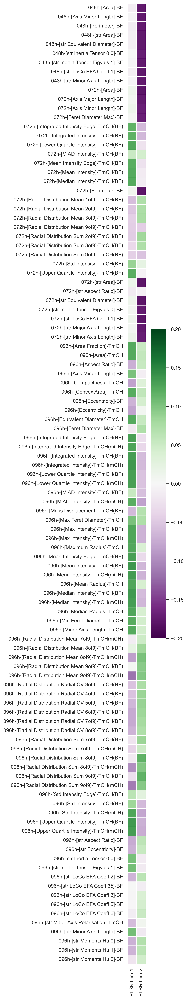

In [17]:
fig,ax = plt.subplots(1,1,figsize = (5,30))

sns.heatmap(loadings_df.loc[main_contributers_axes_and_morph], cmap = "PRGn",vmin=-0.2, vmax=0.2, xticklabels='auto', yticklabels='auto', ax=ax,linewidths=0.5,square=True)
ax.set_facecolor('white')

plt.tight_layout()
plt.savefig(f"{out_PLSR}/PLSR Morph loadings 0.05 quantile axes and morph.pdf", format="pdf", bbox_inches="tight")
plt.show()

meta NOT subset; don't know how to subset; dropped


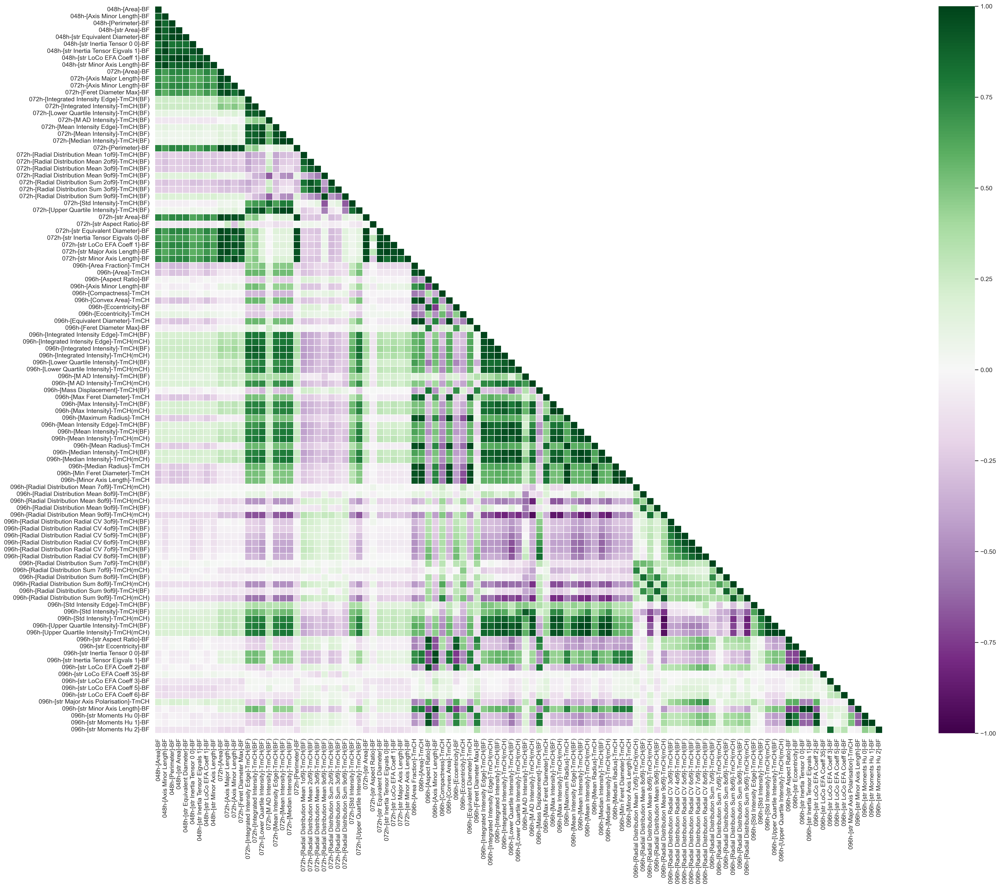

In [18]:
corr_analysis = X[main_contributers_axes_and_morph].corr()
fig,ax = plt.subplots(1,1,figsize = (30,22))

mask = np.ones(corr_analysis.shape, dtype= bool)
mask = np.triu(mask, k = 1)

sns.heatmap(corr_analysis, cmap = "PRGn",vmin=-1, vmax=1, xticklabels='auto', yticklabels='auto', mask=mask, ax=ax,linewidths=0.5,square = True)
ax.set_facecolor('white')

plt.tight_layout()
plt.savefig(f"{out_PLSR}/Correlations 0.05 quantile axes and morph.pdf", format="pdf", bbox_inches="tight")
plt.show()

<Axes: xlabel='PC_1', ylabel='PC_2'>

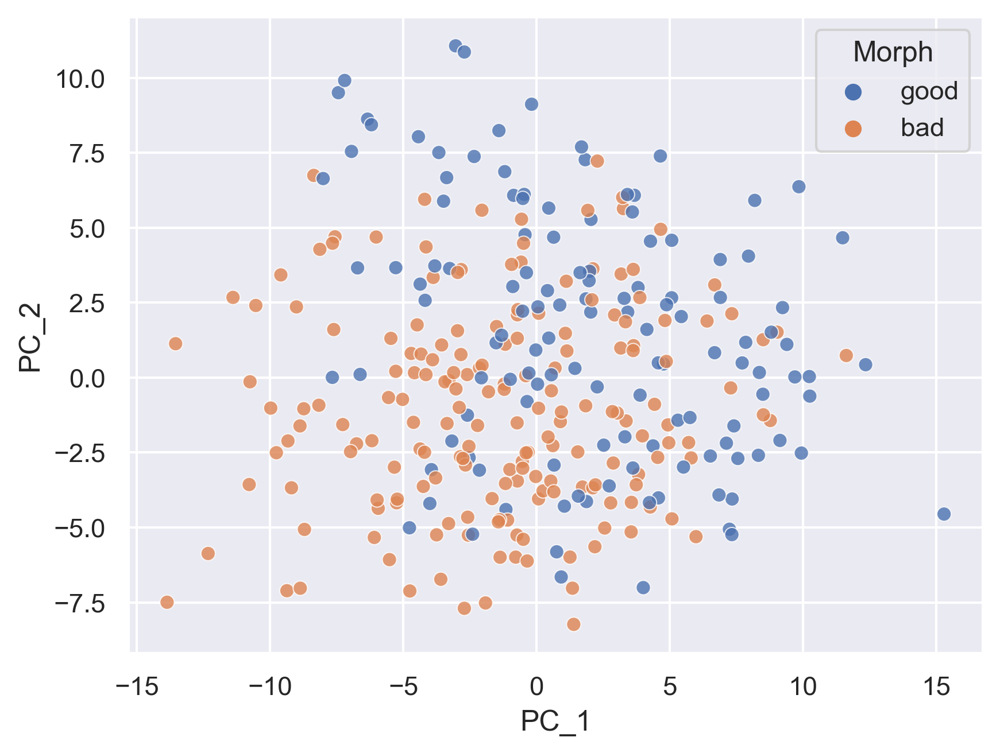

In [19]:
test_pca = opp.PCA_with_indices_and_ground_truth(X[main_contributers],dat_morph[gt_keys],gt_keys,standardscale=True)
sns.scatterplot(test_pca,x="PC_1",y="PC_2",hue="Morph",**{"alpha":0.8})

# Main Contributors (0.01 and 0.99 percentile)

In [20]:
quantiles_upper = np.quantile(loadings_df,0.99,axis=0)
quantiles_lower = np.quantile(loadings_df,0.01,axis=0)
main_contributers = [
    key for key in loadings_df.index if (
        loadings_df.loc[key][0]>=quantiles_upper[0] or 
        loadings_df.loc[key][1]>=quantiles_upper[1] or 
        loadings_df.loc[key][0]<=quantiles_lower[0] or 
        loadings_df.loc[key][1]<=quantiles_lower[1]
    )
]

main_contributers

['072h-[Area]-BF',
 '072h-[Perimeter]-BF',
 '072h-[str Equivalent Diameter]-BF',
 '072h-[str LoCo EFA Coeff 1]-BF',
 '096h-[Mean Intensity]-TmCH(BF)',
 '096h-[Median Intensity]-TmCH(BF)',
 '096h-[Upper Quartile Intensity]-TmCH(BF)',
 '096h-[Radial Distribution Sum 8of9]-TmCH(BF)',
 '096h-[Radial Distribution Sum 9of9]-TmCH(BF)',
 '096h-[Integrated Intensity]-TmCH(mCH)',
 '096h-[Radial Distribution Sum 8of9]-TmCH(mCH)',
 '096h-[Radial Distribution Sum 9of9]-TmCH(mCH)',
 '096h-[Radial Distribution Mean 8of9]-TmCH(mCH)',
 '096h-[Radial Distribution Mean 9of9]-TmCH(mCH)']

meta NOT subset; don't know how to subset; dropped


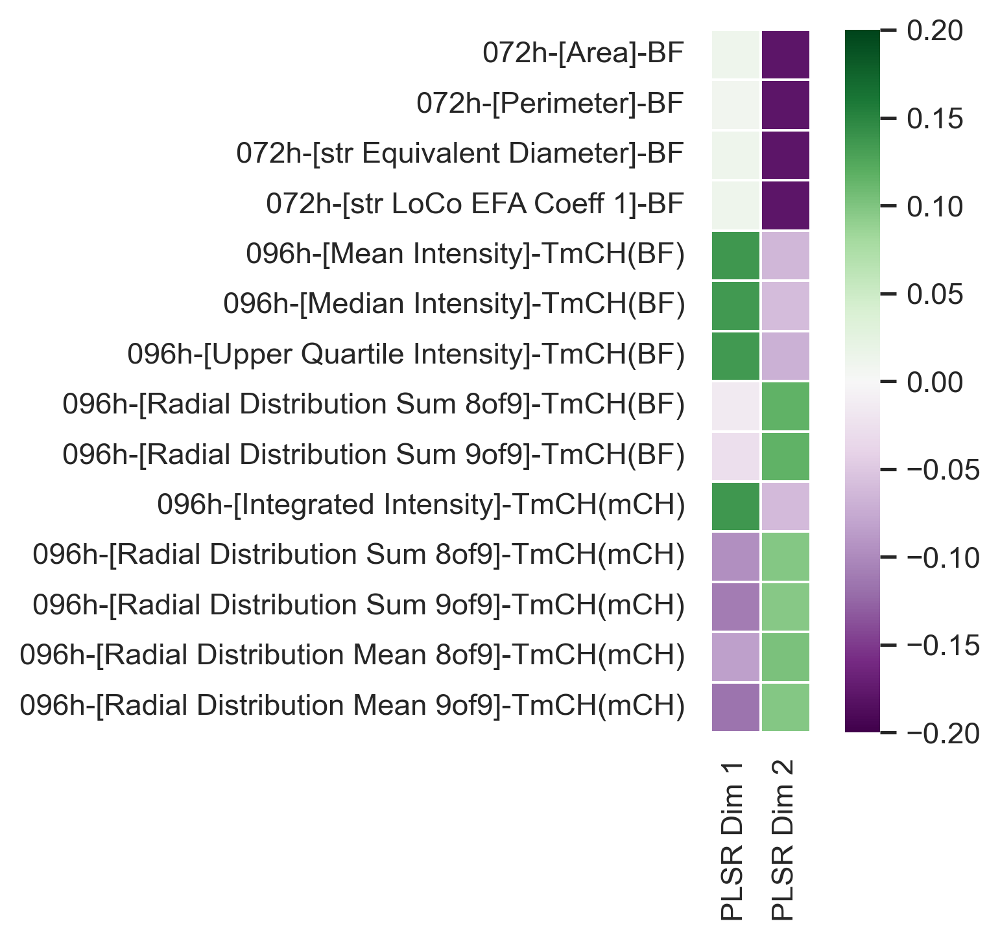

In [21]:
fig,ax = plt.subplots(1,1,figsize = (5,5))

sns.heatmap(loadings_df.loc[main_contributers], cmap = "PRGn",vmin=-0.2, vmax=0.2, xticklabels='auto', yticklabels='auto', ax=ax,linewidths=0.5,square=True)
ax.set_facecolor('white')

plt.tight_layout()
plt.savefig(f"{out_fig_2}/PLSR Morph loadings 0.01 quantile.pdf", format="pdf", bbox_inches="tight")
plt.show()

<Axes: xlabel='PC_1', ylabel='PC_2'>

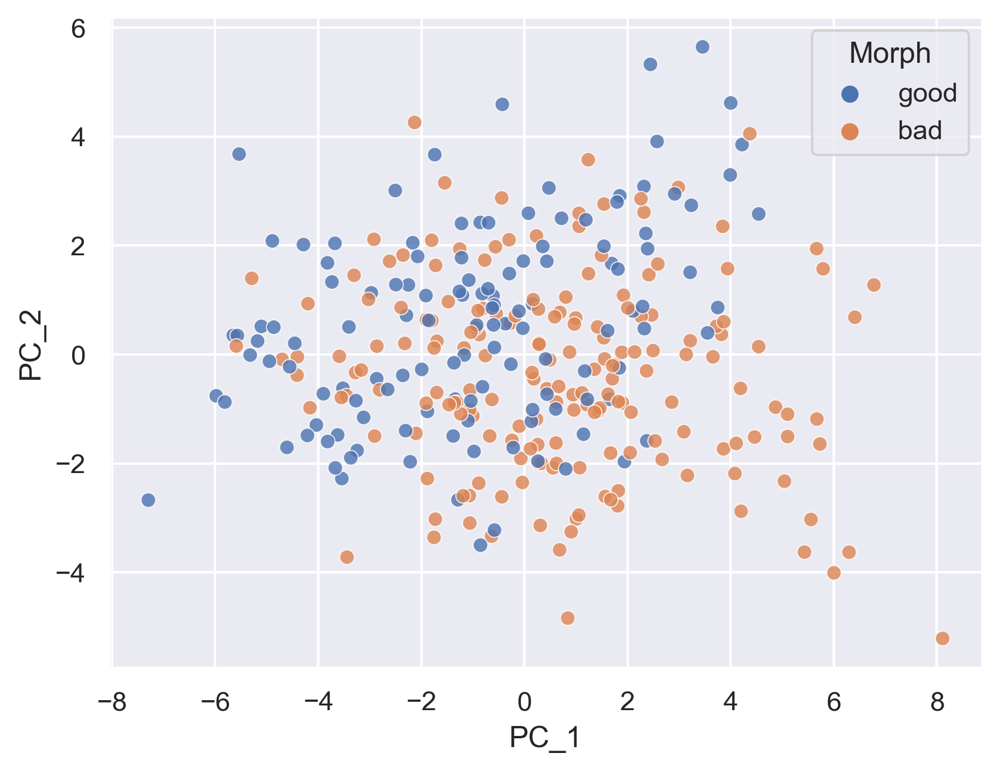

In [22]:
test_pca = opp.PCA_with_indices_and_ground_truth(X[main_contributers],dat_morph[gt_keys],gt_keys,standardscale=True)
sns.scatterplot(test_pca,x="PC_1",y="PC_2",hue="Morph",**{"alpha":0.8})

# Comparison with PCA of transcriptome selected feature space

In [23]:
neural_corr_feature_table = pd.read_csv(f"{table_location}/ms_cor_features_120h_neural_score_fdr_5.csv")
somitic_corr_feature_table = pd.read_csv(f"{table_location}/ms_cor_features_120h_somitic_score_fdr_5.csv")
all_corr_feats = list(set(somitic_corr_feature_table["Unnamed: 0"].to_numpy()[:-1]).union(set(neural_corr_feature_table["Unnamed: 0"].to_numpy()[:-1])))
all_corr_feats = sorted([feat[1:] for feat in all_corr_feats])
selected_feature_space = dat_morph[all_corr_feats+gt_keys]
selected_feature_space


,072h_raw_CH__bf_mask_Intensity_IntegratedIntensity,072h_raw_CH__bf_mask_Intensity_IntegratedIntensityEdge,072h_raw_CH__bf_mask_Intensity_LowerQuartileIntensity,072h_raw_CH__bf_mask_Intensity_MaxIntensity,072h_raw_CH__bf_mask_Intensity_MaxIntensityEdge,072h_raw_CH__bf_mask_Intensity_MeanIntensity,072h_raw_CH__bf_mask_Intensity_MeanIntensityEdge,072h_raw_CH__bf_mask_Intensity_MedianIntensity,072h_raw_CH__bf_mask_Intensity_MinIntensity,072h_raw_CH__bf_mask_Intensity_StdIntensity,...,096h_raw_CH_bra_mask_RadialDistribution_FracAtD_9of9,096h_raw_CH_bra_mask_RadialDistribution_MeanFrac_9of9,096h_raw_CH_bra_mask_RadialDistribution_RadialCV_8of9,096h_raw_CH_bra_mask_RadialDistribution_RadialCV_9of9,Run,Plate,ID,Axes,Morph,Morph_Class
0,1.953623,1.126681,0.958873,0.294509,0.234259,0.943515,0.463625,0.938288,-0.140495,0.932570,...,-0.810732,-0.636610,0.690890,2.119005,RR,1,A1,single,good,single_good
1,-0.179189,0.364142,0.639003,-0.423710,0.524678,0.527798,0.830867,0.575886,1.113505,-0.109051,...,-0.602018,-0.537933,-0.217619,0.462752,RR,1,A2,single,bad,single_bad
2,1.315104,0.853903,0.326347,-0.307248,0.343390,0.261319,-0.028601,0.429243,-0.688743,0.203421,...,-0.290369,-0.087457,4.065264,2.062260,RR,1,A3,single,bad,single_bad
3,0.556150,0.362318,0.657785,0.687307,0.049983,0.909369,0.576080,0.845947,-0.509377,1.153055,...,-0.840545,-0.634546,2.070587,2.007750,RR,1,A4,single,good,single_good
4,-1.267764,-1.468889,-1.375890,-1.314291,-1.673273,-1.477364,-1.577137,-1.572430,-2.083521,-1.105306,...,1.814237,2.017775,-1.745302,-1.313809,RR,1,A5,single,bad,single_bad
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
429,0.694100,0.829379,0.844246,0.121473,0.628440,0.811309,0.840994,0.899456,0.294225,0.436363,...,-0.571945,-0.402378,0.666436,0.138512,TR,2,H4,single,good,single_good
430,-0.004885,-0.206140,-0.569008,1.199871,1.587548,0.406127,-0.021145,0.380931,-0.341677,2.865211,...,1.700596,0.929944,1.955767,1.607390,TR,2,H5,single,bad,single_bad
434,0.686455,0.434686,0.561542,0.621971,0.657981,0.710768,0.421459,0.833800,-0.357096,1.316050,...,-0.374639,-0.771763,1.407654,0.776555,TR,2,H9,single,good,single_good
436,1.576747,1.564419,2.490100,1.677727,2.527381,2.496344,2.133703,2.608076,1.973397,1.943263,...,-0.814514,-1.347434,-1.187889,-1.093241,TR,2,H11,single,good,single_good


meta NOT subset; don't know how to subset; dropped


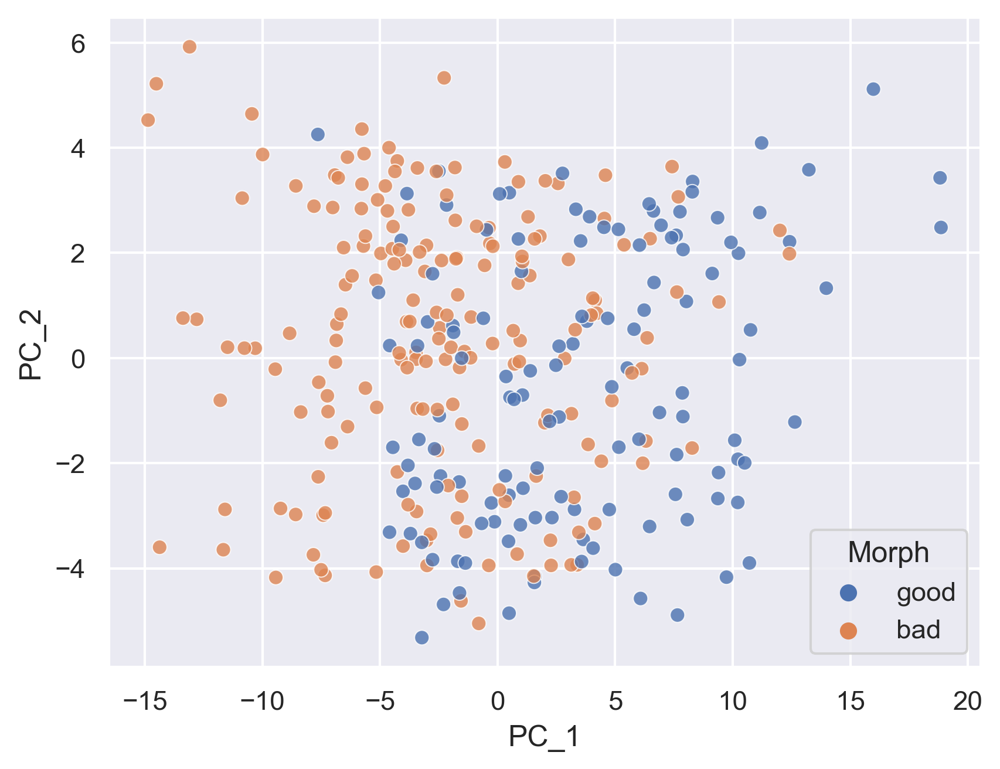

In [24]:
for_jesse_path = r"C:\Users\savill\OneDrive\Documents\PhD Jesse\Documents"


test_pca = opp.PCA_with_indices_and_ground_truth(dat_morph[all_corr_feats],dat_morph[gt_keys],gt_keys,standardscale=True)
sns.scatterplot(test_pca,x="PC_1",y="PC_2",hue="Morph",**{"alpha":0.8})
plt.savefig(f"{for_jesse_path}/PCA_transcriptome_selected_feature_space.pdf", format="pdf", bbox_inches="tight")

15


meta NOT subset; don't know how to subset; dropped


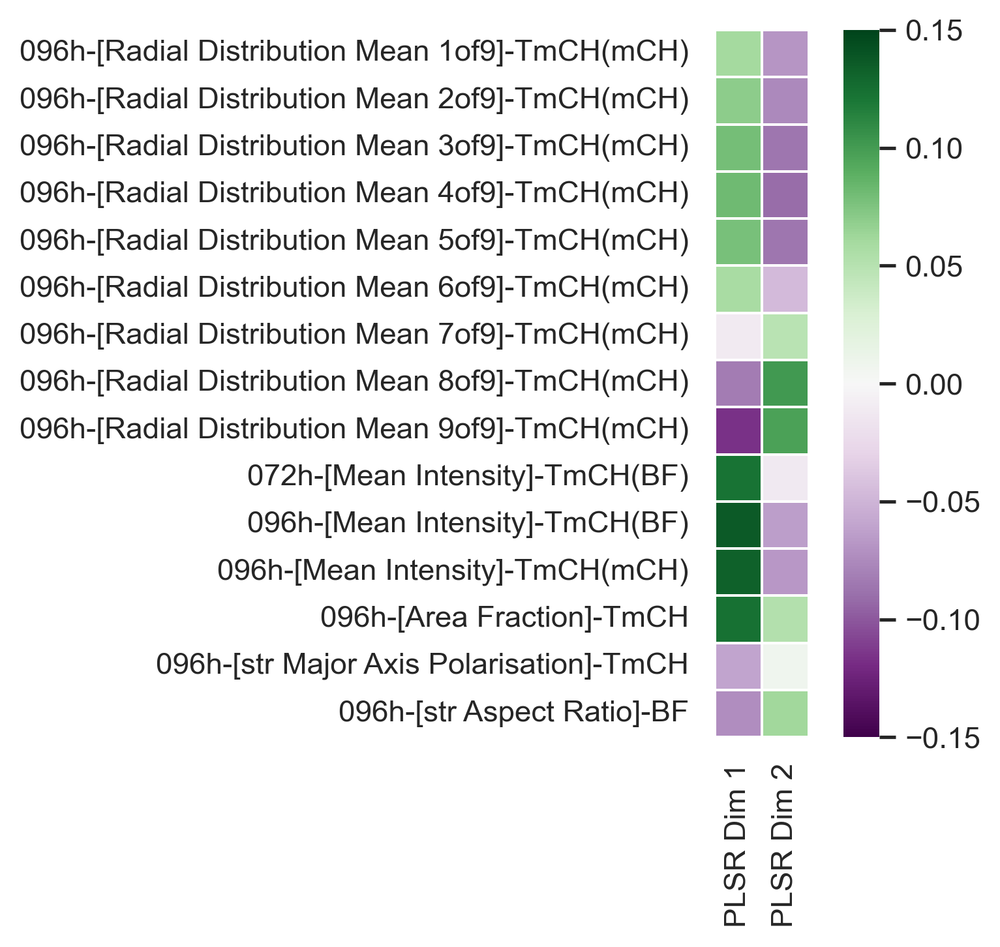

In [25]:
main_contributers_manual_2 = [
    '096h-[Radial Distribution Mean 1of9]-TmCH(mCH)',
    '096h-[Radial Distribution Mean 2of9]-TmCH(mCH)',
    '096h-[Radial Distribution Mean 3of9]-TmCH(mCH)',
    '096h-[Radial Distribution Mean 4of9]-TmCH(mCH)',
    '096h-[Radial Distribution Mean 5of9]-TmCH(mCH)',
    '096h-[Radial Distribution Mean 6of9]-TmCH(mCH)',
    '096h-[Radial Distribution Mean 7of9]-TmCH(mCH)',
    '096h-[Radial Distribution Mean 8of9]-TmCH(mCH)',
    '096h-[Radial Distribution Mean 9of9]-TmCH(mCH)',
    '072h-[Mean Intensity]-TmCH(BF)',
    '096h-[Mean Intensity]-TmCH(BF)',
    '096h-[Mean Intensity]-TmCH(mCH)',
    '096h-[Area Fraction]-TmCH',
    '096h-[str Major Axis Polarisation]-TmCH',
    '096h-[str Aspect Ratio]-BF',
]


print(len(main_contributers_manual_2))

fig,ax = plt.subplots(1,1,figsize = (5,5))

sns.heatmap(data = loadings_df.loc[main_contributers_manual_2], cmap = "PRGn",vmin=-0.15, vmax=0.15, xticklabels='auto', yticklabels='auto', ax=ax,linewidths=0.5,square=True)
ax.set_facecolor('white')

out_PLSR = f"{home_directory}/Plots/PLSR Feature Plots/"

plt.tight_layout()
plt.savefig(f"{out_PLSR}/PLSR Morph loadings manual features.pdf", format="pdf", bbox_inches="tight")
plt.show()

In [26]:
loadings_df.loc[main_contributers_manual_2].min()

PLSR Dim 1   -0.117107
PLSR Dim 2   -0.091400
dtype: float64